In [13]:
import flappy_bird_gymnasium
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque
import gym
from gym import spaces
import pygame
import random
import pandas as pd
import gymnasium as gym
from gymnasium import spaces
import matplotlib.pyplot as plt
from stable_baselines3 import PPO
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import BaseCallback
import sys


In [14]:
number_episodes= 2000
list_alpha = [0.01, 0.5]
list_gamma = [0.9, 1]
list_epsilon =[0.01,0.2]
class metrics:
    liste = []
    standard = 0
    name = ""
Alpha = metrics
Alpha.liste = [0.01, 0.5]
Alpha.standard = 0.1
Alpha.name = "alpha"
Gamma = metrics
Gamma.liste= [0.9, 0.99]
Gamma.standard = 0.99
Gamma.name = "gamma"
Epsilon = metrics
Epsilon.liste= [0.01,0.2]
Epsilon.standard = 0.1
Epsilon.name = "epsilon"

In [15]:
number_episodes=2000    

# Environment with static pipes

### Fixed Pipes

In [16]:
import numpy as np
import random
import gym
from gym import spaces
import pygame
list_rewards = []
list_pipes = []
class FlappyBirdEnv(gym.Env):
    metadata = {'render_modes': ['human']}
    
    def __init__(self):
        super(FlappyBirdEnv, self).__init__()
        self.screen_width = 288
        self.screen_height = 512
        self.pipe_gap = 200
        self.bird_y = self.screen_height // 2
        self.bird_x = self.screen_width // 4
        self.gravity = 1
        self.jump_strength = -10
        self.pipe_width = 50
        self.pipe_velocity = -5
        self.pipe_x = self.screen_width  # Static x-position for pipes
        
        self.action_space = spaces.Discrete(2)  # 0: No flap, 1: Flap
        self.observation_space = spaces.Box(
            low=np.array([0, 0, 0, 0], dtype=np.float32),
            high=np.array([self.screen_width, self.screen_height, self.screen_width, self.screen_height], dtype=np.float32)
        )
        
        self.screen = None
        self.clock = None
        self.done = False
        self.bird_vel_y = 0
        self.score = 0
        self.pipes = []
        self.passed_pipes = 0
        self.seed_value = 42  # Seed für reproduzierbare Rohre
        
    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.bird_y = self.screen_height // 2
        self.bird_x = self.screen_width // 4
        self.bird_vel_y = 0
        self.done = False
        self.score = 0
        self.passed_pipes = 0
        self._set_seed()
        self.pipes = self._create_fixed_pipes()
        return self._get_observation(), {}
    
    def step(self, action):
        if action == 1:
            self.bird_vel_y = self.jump_strength
        self.bird_vel_y += self.gravity
        self.bird_y += self.bird_vel_y
        
        if self.bird_y < 0:
            self.bird_y = 0
            self.done = True
        if self.bird_y > self.screen_height:
            self.bird_y = self.screen_height
            self.done = True
        
        self._move_pipes()
        self._check_collision()
        
        # Reward für jede Zeiteinheit
        reward =0
        
        # Zusätzlicher Reward für das Passieren eines Rohrs
        if self._passed_pipe():
            reward += 100
            self.passed_pipes += 1
            #print(f"Pipe passed! Total pipes passed: {self.passed_pipes}")
        
        # Bestrafung für das Sterben
        if self.done:
            reward -= 10
        
        observation = self._get_observation()
        info = {'pipe_count': self.passed_pipes}
        return observation, reward, self.done, False, info
    
    def render(self, mode='human'):
        if self.screen is None:
            pygame.init()
            self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
            self.clock = pygame.time.Clock()
        
        self.screen.fill((0, 0, 255))
        pygame.draw.circle(self.screen, (255, 255, 0), (self.bird_x, self.bird_y), 20)
        
        for pipe in self.pipes:
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['top'])
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['bottom'])
        
        pygame.display.flip()
        self.clock.tick(30)
    
    def close(self):
        if self.screen is not None:
            pygame.quit()
            self.screen = None
    
    def _create_fixed_pipes(self):
        # Create fixed pipes positions
        pipes = []
        x_positions = [self.screen_width + i * 3 * self.pipe_width for i in range(5)]
        for x in x_positions:
            gap_start = random.randint(0, self.screen_height - self.pipe_gap)
            top_rect = pygame.Rect(x, 0, self.pipe_width, gap_start)
            bottom_rect = pygame.Rect(x, gap_start + self.pipe_gap, self.pipe_width, self.screen_height)
            pipes.append({'top': top_rect, 'bottom': bottom_rect, 'passed': False})
        return pipes
    
    def _move_pipes(self):
        for pipe in self.pipes:
            pipe['top'].x += self.pipe_velocity
            pipe['bottom'].x += self.pipe_velocity
        
        if self.pipes and self.pipes[0]['top'].x < -self.pipe_width:
            self.pipes.pop(0)
        
        if not self.pipes or self.pipes[-1]['top'].x < self.screen_width - 3 * self.pipe_width:
            self.pipes.append(self._create_pipe())
    
    def _check_collision(self):
        if self.bird_y >= self.screen_height or self.bird_y <= 0:
            self.done = True
            return
        
        bird_rect = pygame.Rect(self.bird_x, self.bird_y, 20, 20)
        for pipe in self.pipes:
            if bird_rect.colliderect(pipe['top']) or bird_rect.colliderect(pipe['bottom']):
                self.done = True
                return
    
    def _get_observation(self):
        pipe = self.pipes[0]
        return np.array([self.bird_x, self.bird_y, pipe['top'].x, pipe['top'].bottom], dtype=np.float32)

    def _passed_pipe(self):
        for pipe in self.pipes:
            if not pipe['passed'] and pipe['top'].x < self.bird_x:
                pipe['passed'] = True
                return True
        return False
    
    def _set_seed(self):
        random.seed(self.seed_value)
        np.random.seed(self.seed_value)

class QLearningAgent:
    def __init__(self, state_bins, num_actions, alpha=0.1, gamma=0.99, epsilon=0.1, observation_space=None):
        self.state_bins = state_bins
        self.num_actions = num_actions
        self.alpha = alpha  # Lernrate
        self.gamma = gamma  # Diskontierungsfaktor
        self.epsilon = epsilon  # Epsilon für epsilon-greedy Policy
        self.q_table = np.zeros((*state_bins, num_actions))
        self.observation_space = observation_space

    def discretize(self, state):
        state_indices = []
        for i in range(len(state)):
            idx = np.digitize(state[i], np.linspace(0, self.observation_space.high[i], self.state_bins[i])) - 1
            idx = min(self.state_bins[i] - 1, max(0, idx))  # Ensure idx is within bounds
            state_indices.append(idx)
        return tuple(state_indices)

    def choose_action(self, state):
        if random.uniform(0, 1) < self.epsilon:
            return random.choice(range(self.num_actions))  # Zufällige Aktion (explore)
        else:
            return np.argmax(self.q_table[state])  # Beste Aktion (exploit)

    def update(self, state, action, reward, next_state):
        best_next_action = np.argmax(self.q_table[next_state])
        td_target = reward + self.gamma * self.q_table[next_state][best_next_action]
        td_error = td_target - self.q_table[state][action]
        self.q_table[state][action] += self.alpha * td_error

    def train(self, env, num_episodes):
        total_rewards = []
        pipes_passed = []
        for episode in range(num_episodes):
            state, _ = env.reset()
            state = self.discretize(state)
            done = False
            episode_reward = 0
            episode_pipes = 0
            while not done:
                action = self.choose_action(state)
                next_state, reward, done, truncated, info = env.step(action)
                next_state = self.discretize(next_state)
                self.update(state, action, reward, next_state)
                state = next_state
                episode_reward += reward
                episode_pipes = info.get('pipe_count', episode_pipes)
            total_rewards.append(episode_reward)
            pipes_passed.append(episode_pipes)
            print(f"Episode {episode + 1}/{num_episodes} completed, Reward: {episode_reward}, Pipes Passed: {episode_pipes}")
            list_rewards.append(episode_reward)
            list_pipes.append(episode_pipes)
        return total_rewards, pipes_passed

    def evaluate(self, env, num_episodes=10):
        evaluation_rewards = []
        evaluation_pipes_passed = []
        for episode in range(num_episodes):
            state, _ = env.reset()
            state = self.discretize(state)
            done = False
            episode_reward = 0
            episode_pipes = 0
            while not done:
                action = np.argmax(self.q_table[state])
                next_state, reward, done, truncated, info = env.step(action)
                next_state = self.discretize(next_state)
                state = next_state
                episode_reward += reward
                episode_pipes = info.get('pipe_count', episode_pipes)
            evaluation_rewards.append(episode_reward)
            evaluation_pipes_passed.append(episode_pipes)
            print(f"Evaluation Episode {episode + 1}/{num_episodes} completed, Reward: {episode_reward}, Pipes Passed: {episode_pipes}")
        return evaluation_rewards, evaluation_pipes_passed

    def save(self, filename):
        np.save(filename, self.q_table)
        
    def load(self, filename):
        self.q_table = np.load(filename)

# Verwendung der benutzerdefinierten Umgebung und des Q-Learning-Agenten
env = FlappyBirdEnv()
state_bins = (10, 10, 10, 10)  # Diskretisierung in 10 Bins pro Zustandsdimension
num_actions = env.action_space.n

agent = QLearningAgent(state_bins=state_bins, num_actions=num_actions, observation_space=env.observation_space)
rewards, pipes_passed = agent.train(env, num_episodes=number_episodes)

# Speichern der trainierten Q-Tabelle
agent.save('trained_q_table.npy')



Episode 1/2000 completed, Reward: -10, Pipes Passed: 0
Episode 2/2000 completed, Reward: -10, Pipes Passed: 0
Episode 3/2000 completed, Reward: -10, Pipes Passed: 0
Episode 4/2000 completed, Reward: -10, Pipes Passed: 0
Episode 5/2000 completed, Reward: -10, Pipes Passed: 0
Episode 6/2000 completed, Reward: -10, Pipes Passed: 0
Episode 7/2000 completed, Reward: -10, Pipes Passed: 0
Episode 8/2000 completed, Reward: -10, Pipes Passed: 0
Episode 9/2000 completed, Reward: -10, Pipes Passed: 0
Episode 10/2000 completed, Reward: -10, Pipes Passed: 0
Episode 11/2000 completed, Reward: -10, Pipes Passed: 0
Episode 12/2000 completed, Reward: -10, Pipes Passed: 0
Episode 13/2000 completed, Reward: -10, Pipes Passed: 0
Episode 14/2000 completed, Reward: -10, Pipes Passed: 0
Episode 15/2000 completed, Reward: -10, Pipes Passed: 0
Episode 16/2000 completed, Reward: -10, Pipes Passed: 0
Episode 17/2000 completed, Reward: -10, Pipes Passed: 0
Episode 18/2000 completed, Reward: -10, Pipes Passed: 0
E

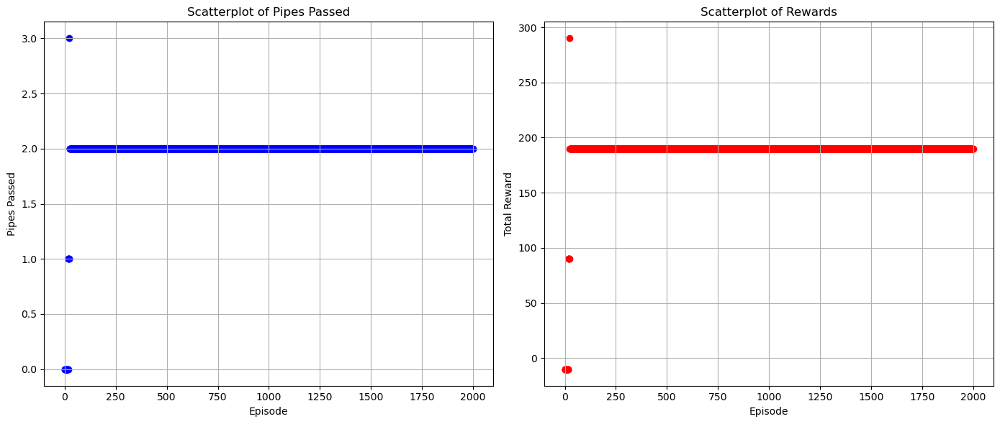

In [17]:
df = pd.DataFrame({"Reward": list_rewards, "Pipes": list_pipes})
df["Pipe State"]="Static Pipes"
df["Index"] = df.index

# df["Pipes"].max()
# print(df.loc[df["Pipes"]==df["Pipes"].max()])

# Scatterplots erstellen
plt.figure(figsize=(14, 6))

# Scatterplot für Pipes
plt.subplot(1, 2, 1)
plt.scatter(df['Index'], df['Pipes'], color='blue')
plt.title('Scatterplot of Pipes Passed')
plt.xlabel('Episode')
plt.ylabel('Pipes Passed')
plt.grid(True)

# Scatterplot für Rewards
plt.subplot(1, 2, 2)
plt.scatter(df['Index'], df['Reward'], color='red')
plt.title('Scatterplot of Rewards')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.grid(True)

plt.tight_layout()
plt.show()

### Variable Pipes

#### Env and Agent

In [18]:
list_rewards=[]
list_pipes=[]

class FlappyBirdEnv(gym.Env):
    metadata = {'render_modes': ['human']}
    
    def __init__(self):
        super(FlappyBirdEnv, self).__init__()
        self.screen_width = 288
        self.screen_height = 512
        self.pipe_gap = 200
        self.bird_y = self.screen_height // 2
        self.bird_x = self.screen_width // 4
        self.gravity = 1
        self.jump_strength = -10
        self.pipe_width = 50
        self.pipe_velocity = -5
        self.pipe_x = self.screen_width  # Static x-position for pipes
        
        self.action_space = spaces.Discrete(2)  # 0: No flap, 1: Flap
        self.observation_space = spaces.Box(
            low=np.array([0, 0, 0, 0], dtype=np.float32),
            high=np.array([self.screen_width, self.screen_height, self.screen_width, self.screen_height], dtype=np.float32)
        )
        
        self.screen = None
        self.clock = None
        self.done = False
        self.bird_vel_y = 0
        self.score = 0
        self.pipes = []
        self.passed_pipes = 0
        self.seed_value = 42  # Seed für reproduzierbare Rohre
        
    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.bird_y = self.screen_height // 2
        self.bird_x = self.screen_width // 4
        self.bird_vel_y = 0
        self.done = False
        self.score = 0
        self.passed_pipes = 0
        self._set_seed()
        self.pipes = self._create_fixed_pipes()
        return self._get_observation(), {}
    
    def step(self, action):
        if action == 1:
            self.bird_vel_y = self.jump_strength
        self.bird_vel_y += self.gravity
        self.bird_y += self.bird_vel_y
        
        if self.bird_y < 0:
            self.bird_y = 0
            self.done = True
        if self.bird_y > self.screen_height:
            self.bird_y = self.screen_height
            self.done = True
        
        self._move_pipes()
        self._check_collision()
        
        reward = 0.1  # Pro Zeiteinheit
        
        if self._passed_pipe():
            reward += 1
            self.passed_pipes += 1
            print(f"Pipe passed! Total pipes passed: {self.passed_pipes}")
        
        if self.done:
            reward -= 1
        
        observation = self._get_observation()
        info = {'pipe_count': self.passed_pipes}
        return observation, reward, self.done, False, info
    
    def render(self, mode='human'):
        if self.screen is None:
            pygame.init()
            self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
            self.clock = pygame.time.Clock()
        
        self.screen.fill((0, 0, 255))
        pygame.draw.circle(self.screen, (255, 255, 0), (self.bird_x, self.bird_y), 20)
        
        for pipe in self.pipes:
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['top'])
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['bottom'])
        
        pygame.display.flip()
        self.clock.tick(30)
    
    def close(self):
        if self.screen is not None:
            pygame.quit()
            self.screen = None
    
    def _create_fixed_pipes(self):
        # Create fixed pipes positions
        pipes = []
        x_positions = [self.screen_width + i * 3 * self.pipe_width for i in range(5)]
        for x in x_positions:
            gap_start = random.randint(0, self.screen_height - self.pipe_gap)
            top_rect = pygame.Rect(x, 0, self.pipe_width, gap_start)
            bottom_rect = pygame.Rect(x, gap_start + self.pipe_gap, self.pipe_width, self.screen_height)
            pipes.append({'top': top_rect, 'bottom': bottom_rect, 'passed': False})
        return pipes
    
    def _move_pipes(self):
        for pipe in self.pipes:
            pipe['top'].x += self.pipe_velocity
            pipe['bottom'].x += self.pipe_velocity
        
        if self.pipes and self.pipes[0]['top'].x < -self.pipe_width:
            self.pipes.pop(0)
        
        if not self.pipes or self.pipes[-1]['top'].x < self.screen_width - 3 * self.pipe_width:
            self.pipes.append(self._create_pipe())
    
    def _check_collision(self):
        if self.bird_y >= self.screen_height or self.bird_y <= 0:
            self.done = True
            return
        
        bird_rect = pygame.Rect(self.bird_x, self.bird_y, 20, 20)
        for pipe in self.pipes:
            if bird_rect.colliderect(pipe['top']) or bird_rect.colliderect(pipe['bottom']):
                self.done = True
                return
    
    def _get_observation(self):
        pipe = self.pipes[0]
        return np.array([self.bird_x, self.bird_y, pipe['top'].x, pipe['top'].bottom], dtype=np.float32)

    def _passed_pipe(self):
        for pipe in self.pipes:
            if not pipe['passed'] and pipe['top'].x < self.bird_x:
                pipe['passed'] = True
                return True
        return False
    
    def _set_seed(self):
        random.seed(self.seed_value)
        np.random.seed(self.seed_value)

class QLearningAgent:
    def __init__(self, state_bins, num_actions, alpha=0.1, gamma=0.99, epsilon=0.1, observation_space=None):
        self.state_bins = state_bins
        self.num_actions = num_actions
        self.alpha = alpha  # Lernrate
        self.gamma = gamma  # Diskontierungsfaktor
        self.epsilon = epsilon  # Epsilon für epsilon-greedy Policy
        self.q_table = np.zeros((*state_bins, num_actions))
        self.observation_space = observation_space

    def discretize(self, state):
        state_indices = []
        for i in range(len(state)):
            idx = np.digitize(state[i], np.linspace(0, self.observation_space.high[i], self.state_bins[i])) - 1
            idx = min(self.state_bins[i] - 1, max(0, idx))  # Ensure idx is within bounds
            state_indices.append(idx)
        return tuple(state_indices)

    def choose_action(self, state):
        if random.uniform(0, 1) < self.epsilon:
            return random.choice(range(self.num_actions))  # Zufällige Aktion (explore)
        else:
            return np.argmax(self.q_table[state])  # Beste Aktion (exploit)

    def update(self, state, action, reward, next_state):
        best_next_action = np.argmax(self.q_table[next_state])
        td_target = reward + self.gamma * self.q_table[next_state][best_next_action]
        td_error = td_target - self.q_table[state][action]
        self.q_table[state][action] += self.alpha * td_error

    def train(self, env, num_episodes):
        total_rewards = []
        pipes_passed = []
        for episode in range(num_episodes):
            state, _ = env.reset()
            state = self.discretize(state)
            done = False
            episode_reward = 0
            episode_pipes = 0
            while not done:
                action = self.choose_action(state)
                next_state, reward, done, truncated, info = env.step(action)
                next_state = self.discretize(next_state)
                self.update(state, action, reward, next_state)
                state = next_state
                episode_reward += reward
                episode_pipes = info.get('pipe_count', episode_pipes)
            total_rewards.append(episode_reward)
            pipes_passed.append(episode_pipes)
            print(f"Episode {episode + 1}/{num_episodes} completed, Reward: {episode_reward}, Pipes Passed: {episode_pipes}")
            list_pipes.append(episode_pipes)
            list_rewards.append(episode_reward)
        return total_rewards, pipes_passed

    def evaluate(self, env, num_episodes=10):
        evaluation_rewards = []
        evaluation_pipes_passed = []
        for episode in range(num_episodes):
            state, _ = env.reset()
            state = self.discretize(state)
            done = False
            episode_reward = 0
            episode_pipes = 0
            while not done:
                action = np.argmax(self.q_table[state])
                next_state, reward, done, truncated, info = env.step(action)
                next_state = self.discretize(next_state)
                state = next_state
                episode_reward += reward
                episode_pipes = info.get('pipe_count', episode_pipes)
            evaluation_rewards.append(episode_reward)
            evaluation_pipes_passed.append(episode_pipes)
            print(f"Evaluation Episode {episode + 1}/{num_episodes} completed, Reward: {episode_reward}, Pipes Passed: {episode_pipes}")
        return evaluation_rewards, evaluation_pipes_passed

    def save(self, filename):
        np.save(filename, self.q_table)
        
    def load(self, filename):
        self.q_table = np.load(filename)

# Verwendung der benutzerdefinierten Umgebung
env = FlappyBirdEnv()
state_bins = (10, 10, 10, 10)
num_actions = env.action_space.n

agent = QLearningAgent(state_bins=state_bins, num_actions=num_actions, observation_space=env.observation_space)
rewards, pipes_passed = agent.train(env, num_episodes=number_episodes)

Episode 1/2000 completed, Reward: 1.3000000000000007, Pipes Passed: 0
Episode 2/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 3/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 4/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 5/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 6/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 7/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 8/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 9/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 10/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 11/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 12/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 13/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 14/2000 completed, Reward: 3.000000000000002, Pipes Passed: 0
Episode 15/2000 completed, R

## Plotten der beiden Pipetypen

In [19]:
df_1 = pd.DataFrame({"Reward": list_rewards, "Pipes": list_pipes})
df_1["Pipe State"]="Variable Pipes"
df_1["Index"] = df_1.index
df_combined = pd.concat([df, df_1], ignore_index=True)
df_combined

,Reward,Pipes,Pipe State,Index
0,-10.0,0,Static Pipes,0
1,-10.0,0,Static Pipes,1
2,-10.0,0,Static Pipes,2
3,-10.0,0,Static Pipes,3
4,-10.0,0,Static Pipes,4
...,...,...,...,...
3995,3.0,0,Variable Pipes,1995
3996,3.0,0,Variable Pipes,1996
3997,3.0,0,Variable Pipes,1997
3998,3.0,0,Variable Pipes,1998


<Axes: xlabel='Index', ylabel='Pipes'>

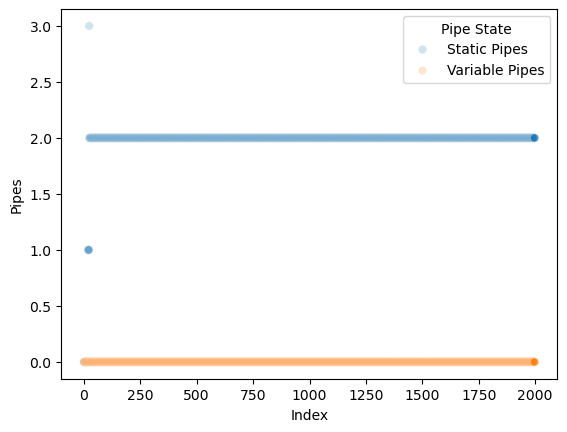

In [20]:
import seaborn as sns
sns.scatterplot(data=df_combined, x="Index", y="Pipes", hue="Pipe State", alpha=0.2)

# DQN Ansatz

In [ ]:
number_episodes = 2000000

## Env

In [21]:
list_rewards=[]
list_pipes=[]

import pygame
import gym
from gym import spaces
import numpy as np
import random

# Initialisiere pygame
pygame.init()

# Spielkonstanten
SCREEN_WIDTH = 288
SCREEN_HEIGHT = 512
PIPE_GAP = 200
BIRD_Y = SCREEN_HEIGHT // 2
BIRD_X = SCREEN_WIDTH // 4
GRAVITY = 1
JUMP_STRENGTH = -10
PIPE_WIDTH = 50
PIPE_VELOCITY = -5
PIPE_X = SCREEN_WIDTH  # Static x-position for pipes

# Flappy Bird Umgebung
class FlappyBirdEnv(gym.Env):
    metadata = {'render_modes': ['human']}
    
    def __init__(self):
        super(FlappyBirdEnv, self).__init__()
        self.screen_width = SCREEN_WIDTH
        self.screen_height = SCREEN_HEIGHT
        self.pipe_gap = PIPE_GAP
        self.bird_y = BIRD_Y
        self.bird_x = BIRD_X
        self.gravity = GRAVITY
        self.jump_strength = JUMP_STRENGTH
        self.pipe_width = PIPE_WIDTH
        self.pipe_velocity = PIPE_VELOCITY
        self.pipe_x = PIPE_X
        
        self.action_space = spaces.Discrete(2)  # 0: No flap, 1: Flap
        self.observation_space = spaces.Box(
            low=np.array([0, 0, 0, 0], dtype=np.float32),
            high=np.array([self.screen_width, self.screen_height, self.screen_width, self.screen_height], dtype=np.float32)
        )
        
        self.screen = None
        self.clock = None
        self.done = False
        self.bird_vel_y = 0
        self.score = 0
        self.pipes = []
        self.passed_pipes = 0
        self.seed_value = 42  # Seed für reproduzierbare Rohre
        
    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.bird_y = self.screen_height // 2
        self.bird_x = self.screen_width // 4
        self.bird_vel_y = 0
        self.done = False
        self.score = 0
        self.passed_pipes = 0
        self._set_seed()
        self.pipes = self._create_fixed_pipes()
        return self._get_observation(), {}
    
    def step(self, action):
        if action == 1:
            self.bird_vel_y = self.jump_strength
        self.bird_vel_y += self.gravity
        self.bird_y += self.bird_vel_y
        
        if self.bird_y < 0:
            self.bird_y = 0
            self.done = True
        if self.bird_y > self.screen_height:
            self.bird_y = self.screen_height
            self.done = True
        
        self._move_pipes()
        self._check_collision()
        
        reward = 0.1  # Pro Zeiteinheit
        
        if self._passed_pipe():
            reward += 1
            self.passed_pipes += 1
            print(f"Pipe passed! Total pipes passed: {self.passed_pipes}")
        
        if self.done:
            reward -= 1
        
        observation = self._get_observation()
        info = {'pipe_count': self.passed_pipes}
        return observation, reward, self.done, False, info
    
    def render(self, mode='human'):
        if self.screen is None:
            pygame.init()
            self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
            self.clock = pygame.time.Clock()
        
        self.screen.fill((0, 0, 255))
        pygame.draw.circle(self.screen, (255, 255, 0), (self.bird_x, self.bird_y), 20)
        
        for pipe in self.pipes:
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['top'])
            pygame.draw.rect(self.screen, (0, 255, 0), pipe['bottom'])
        
        pygame.display.flip()
        self.clock.tick(30)
    
    def close(self):
        if self.screen is not None:
            pygame.quit()
            self.screen = None
    
    def _create_fixed_pipes(self):
        # Create fixed pipes positions
        pipes = []
        x_positions = [self.screen_width + i * 3 * self.pipe_width for i in range(5)]
        for x in x_positions:
            gap_start = random.randint(0, self.screen_height - self.pipe_gap)
            top_rect = pygame.Rect(x, 0, self.pipe_width, gap_start)
            bottom_rect = pygame.Rect(x, gap_start + self.pipe_gap, self.pipe_width, self.screen_height)
            pipes.append({'top': top_rect, 'bottom': bottom_rect, 'passed': False})
        return pipes
    
    def _create_pipe(self):
        x = self.screen_width
        gap_start = random.randint(0, self.screen_height - self.pipe_gap)
        top_rect = pygame.Rect(x, 0, self.pipe_width, gap_start)
        bottom_rect = pygame.Rect(x, gap_start + self.pipe_gap, self.pipe_width, self.screen_height)
        return {'top': top_rect, 'bottom': bottom_rect, 'passed': False}
    
    def _move_pipes(self):
        for pipe in self.pipes:
            pipe['top'].x += self.pipe_velocity
            pipe['bottom'].x += self.pipe_velocity
        
        if self.pipes and self.pipes[0]['top'].x < -self.pipe_width:
            self.pipes.pop(0)
        
        if not self.pipes or self.pipes[-1]['top'].x < self.screen_width - 3 * self.pipe_width:
            self.pipes.append(self._create_pipe())
    
    def _check_collision(self):
        if self.bird_y >= self.screen_height or self.bird_y <= 0:
            self.done = True
            return
        
        bird_rect = pygame.Rect(self.bird_x, self.bird_y, 20, 20)
        for pipe in self.pipes:
            if bird_rect.colliderect(pipe['top']) or bird_rect.colliderect(pipe['bottom']):
                self.done = True
                return
    
    def _get_observation(self):
        pipe = self.pipes[0]
        return np.array([self.bird_x, self.bird_y, pipe['top'].x, pipe['top'].bottom], dtype=np.float32)

    def _passed_pipe(self):
        for pipe in self.pipes:
            if not pipe['passed'] and pipe['top'].x < self.bird_x:
                pipe['passed'] = True
                return True
        return False
    
    def _set_seed(self):
        random.seed(self.seed_value)
        np.random.seed(self.seed_value)

env = FlappyBirdEnv()

## Learning Algorithm

In [22]:
from stable_baselines3 import DQN
from stable_baselines3.common.logger import configure
from stable_baselines3.common.callbacks import BaseCallback
import numpy as np

class RewardCallback(BaseCallback):
    def __init__(self, verbose=0):
        super(RewardCallback, self).__init__(verbose)
        self.episode_rewards = []

    def _on_step(self) -> bool:
        # Überprüfe, ob die Episode beendet ist
        done = self.locals["dones"]
        if done:
            episode_reward = self.locals["infos"][0].get("episode", {}).get("r")
            if episode_reward is not None:
                self.episode_rewards.append(episode_reward)
                if self.verbose > 0:
                    print(f"Episode reward: {episode_reward}")
        return True

# Erstelle das Modell
model = DQN(
    "MlpPolicy",  # Policy type
    env,
    learning_rate=1e-4,
    buffer_size=50000,
    learning_starts=1000,
    batch_size=32,
    tau=1.0,
    gamma=0.99,
    train_freq=4,
    gradient_steps=1,
    target_update_interval=1000,
    verbose=1,
    device='cuda'
)

# Logger konfigurieren
log_dir = "path/to/log"  # Ersetze durch den gewünschten Pfad für deine Logs
new_logger = configure(log_dir, ["stdout", "csv", "tensorboard"])

# Neuen Logger an das Modell anhängen
model.set_logger(new_logger)

# Reward Callback erstellen
reward_callback = RewardCallback(verbose=1)

# Modell trainieren mit Callback
model.learn(total_timesteps=number_episodes, callback=reward_callback)

# Zugriff auf die Rewards nach dem Training
episode_rewards = reward_callback.episode_rewards
print("All episode rewards:", episode_rewards)



Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\Katha\anaconda3\envs\RL\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Logging to path/to/log
Episode reward: 2.3
Episode reward: 2.3
Episode reward: 2.3
Episode reward: 2.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 32.2     |
|    ep_rew_mean      | 2.22     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 9925     |
|    time_elapsed     | 0        |
|    total_timesteps  | 129      |
----------------------------------
Episode reward: 2.2
Episode reward: 2.1
Episode reward: 2.5
Episode reward: 2.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 32.8     |
|    ep_rew_mean      | 2.27     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 9026     |
|    time_elapsed     | 0        |
|    total_timesteps  | 262      |
----------------------------------
Episode reward: 2.1
Episode reward: 2.2
Episode

In [23]:
np.array(episode_rewards).mean()

1.8246064098959798